In [42]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob
from tabulate import tabulate

import matplotlib.pyplot as plt
import pandas as pd

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read all files

In [43]:
#Radix_Cali is a name of a folder containing the cali files, you may create a folder with a different name and replace the folder name here
tk = th.Thicket.from_caliperreader(glob("Radix_Cali/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 238/238 [00:08<00:00, 28.08it/s]


View Calltree

In [44]:
print(tk.tree(metric_column="Avg time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

862.470 main
├─ 0.004 MPI_Comm_dup
├─ 0.000 MPI_Finalize
├─ 0.000 MPI_Finalized
├─ 0.000 MPI_Init
├─ 0.000 MPI_Initialized
├─ 195.338 comm
│  └─ 195.338 comm_small
│     ├─ 0.002 MPI_Allgather
│     ├─ 0.016 MPI_Allreduce
│     └─ 195.319 MPI_Barrier
├─ 665.462 comp
│  ├─ 665.448 comp_large
│  │  └─ 653.628 comm
│  │     └─ 628.101 comm_large
│  │        ├─ nan MPI_Isend
│  │        ├─ 575.275 MPI_Recv
│  │        └─ 14.555 MPI_Send
│  └─ 0.014 comp_small
├─ 0.002 correctness_check
│  ├─ 0.000 MPI_Recv
│  └─ 0.000 MPI_Send
└─ 0.003 data_init_runtime

Legend (Metric: Avg time/rank Min: 0.00 Max: 862.47 indices: {'profile': 38400866})
█ 776.22 - 862.47
█ 603.73 - 776.22
█ 431.23 - 603.73
█ 258.74 - 431.23
█ 86.25 - 258.74
█ 0.00 - 86.25

name User code    ◀  Only in left graph    ▶  Only in right graph



In [45]:
tk.metadata.columns

Index(['cali.caliper.version', 'mpi.world.size', 'spot.metrics',
       'spot.timeseries.metrics', 'spot.format.version', 'spot.options',
       'spot.channels', 'cali.channel', 'spot:node.order', 'spot:output',
       'spot:profile.mpi', 'spot:region.count', 'spot:time.exclusive',
       'spot:time.variance', 'launchdate', 'libraries', 'cmdline', 'cluster',
       'algorithm', 'programming_model', 'data_type', 'size_of_data_type',
       'input_size', 'input_type', 'num_procs', 'scalability', 'group_num',
       'implementation_source'],
      dtype='object')

In [46]:
tk.metadata.head(1)

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:profile.mpi,spot:region.count,spot:time.exclusive,spot:time.variance,launchdate,libraries,cmdline,cluster,algorithm,programming_model,data_type,size_of_data_type,input_size,input_type,num_procs,scalability,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,,,,,
38400866,2.11.0,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,./Radix_Cali/p32-a16777216-s1_perc_perturbed.cali,true,true,true,true,1728967824,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radixSort, 16777216, 1_perc_perturbed]",c,radix,mpi,int,4,16777216,1_perc_perturbed,32,weak,23,online


In [47]:
for node in tk.graph.traverse():
    print(node)

{'name': 'main', 'type': 'function'}
{'name': 'MPI_Comm_dup', 'type': 'function'}
{'name': 'MPI_Finalize', 'type': 'function'}
{'name': 'MPI_Finalized', 'type': 'function'}
{'name': 'MPI_Init', 'type': 'function'}
{'name': 'MPI_Initialized', 'type': 'function'}
{'name': 'comm', 'type': 'function'}
{'name': 'comm_small', 'type': 'function'}
{'name': 'MPI_Allgather', 'type': 'function'}
{'name': 'MPI_Allreduce', 'type': 'function'}
{'name': 'MPI_Barrier', 'type': 'function'}
{'name': 'comp', 'type': 'function'}
{'name': 'comp_large', 'type': 'function'}
{'name': 'comm', 'type': 'function'}
{'name': 'comm_large', 'type': 'function'}
{'name': 'MPI_Isend', 'type': 'function'}
{'name': 'MPI_Recv', 'type': 'function'}
{'name': 'MPI_Send', 'type': 'function'}
{'name': 'comp_small', 'type': 'function'}
{'name': 'correctness_check', 'type': 'function'}
{'name': 'MPI_Recv', 'type': 'function'}
{'name': 'MPI_Send', 'type': 'function'}
{'name': 'data_init_runtime', 'type': 'function'}


In [48]:
tk.dataframe

nid  \
node                                              profile            
{'name': 'main', 'type': 'function'}              38400866     1.0   
                                                  44508863     1.0   
                                                  61857459     1.0   
                                                  65223182     1.0   
                                                  99399265     1.0   
                                                  125334924    1.0   
                                                  153355586    1.0   
                                                  181726771    1.0   
                                                  194818065    1.0   
                                                  212107017    1.0   
                                                  225549113    1.0   
                                                  271839088    1.0   
                                                  278295713    1.0   
                                                  295908057    1.0   
                                                  303117191    1.0   
                                                  313116630    1.0   
                                                  314511645    1.0   
                                                  325380307    1.0   
                                                  329289448    1.0   
                                                  333284717    1.0   
                                                  335126622    1.0   
                                                  355396193    1.0   
                                                  381014763    1.0   
                                                  443373369    1.0   
                                                  443952381    1.0   
                                                  451879386    1.0   
                                                  471061356    1.0   
                                                  481653569    1.0   
                                                  483808858    1.0   
                                                  502931105    1.0   
                                                  517597590    1.0   
                                                  531463191    1.0   
                                                  564930068    1.0   
                                                  651123369    1.0   
                                                  671202059    1.0   
                                                  690849283    1.0   
                                                  699849996    1.0   
                                                  714533786    1.0   
                                                  718061874    1.0   
                                                  757593758    1.0   
                                                  821155239    1.0   
                                                  831241485    1.0   
                                                  831701058    1.0   
                                                  839463646    1.0   
                                                  840820503    1.0   
                                                  861045104    1.0   
                                                  883062439    1.0   
                                                  885126584    1.0   
                                                  912818358    1.0   
                                                  915908491    1.0   
                                                  939387183    1.0   
                                                  940411990    1.0   
                                                  945315522    1.0   
                                                  963671862    1.0   
                                                  970880686    1.0   
                                                  981529366    1.0   
   

Group Performance data by `input_size` in the Thicket metadata table.

In [49]:
tk.metadata_column_to_perfdata("num_procs")
tk.metadata_column_to_perfdata("input_size")
tk.metadata_column_to_perfdata("input_type")

tk.dataframe = tk.dataframe.reset_index().set_index(["node", "num_procs", "input_size", "input_type"]).sort_index()

tk.dataframe.head()

profile  \
node                                 num_procs input_size input_type                     
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed  2778773601   
                                                          Random            3052710598   
                                                          ReverseSorted      271839088   
                                                          Sorted            1611909270   
                                               262144     1_perc_perturbed  2620130239   

                                                                            nid  \
node                                 num_procs input_size input_type              
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed  1.0   
                                                          Random            1.0   
                                                          ReverseSorted     1.0   
                                                          Sorted            1.0   
                                               262144     1_perc_perturbed  1.0   

                                                                             spot.channel  \
node                                 num_procs input_size input_type                        
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed  regionprofile   
                                                          Random            regionprofile   
                                                          ReverseSorted     regionprofile   
                                                          Sorted            regionprofile   
                                               262144     1_perc_perturbed  regionprofile   

                                                                            Min time/rank  \
node                                 num_procs input_size input_type                        
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed       7.572777   
                                                          Random                16.377445   
                                                          ReverseSorted          6.872326   
                                                          Sorted                 7.556044   
                                               262144     1_perc_perturbed      30.756192   

                                                                            Max time/rank  \
node                                 num_procs input_size input_type                        
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed       7.575057   
                                                          Random                16.379607   
                                                          ReverseSorted          6.873707   
                                                          Sorted                 7.556839   
                                               262144     1_perc_perturbed      30.756936   

                                                                            Avg time/rank  \
node                                 num_procs input_size input_type                        
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed       7.573917   
                                                          Random                16.378526   
                                                          ReverseSorted          6.873016   
                                                          Sorted                 7.556442   
                                               262144     1_perc_perturbed      30.756564   

                                                                            Total time  \
node                                 num_procs input_size input_type                     
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed   1

In [50]:
# Define common variables
processes = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
input_size = [65536, 262144, 1048576, 4194304, 16777216, 67108864]
input_type = ["Sorted", "ReverseSorted", "Random", "1_perc_perturbed"]

In [51]:
# Change font size for all plots
plt.rcParams.update({"font.size": 20})

In [52]:
tk.dataframe.head(25)

profile  \
node                                 num_procs input_size input_type                     
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed  2778773601   
                                                          Random            3052710598   
                                                          ReverseSorted      271839088   
                                                          Sorted            1611909270   
                                               262144     1_perc_perturbed  2620130239   
                                                          Random            1165099052   
                                                          ReverseSorted     1454818212   
                                                          Sorted             981529366   
                                               1048576    1_perc_perturbed  1325572810   
                                                          Random            1394451250   
                                                          ReverseSorted     3220130928   
                                                          Sorted             840820503   
                                               4194304    1_perc_perturbed  2960318717   
                                                          Random            3346493794   
                                                          ReverseSorted     1069228043   
                                                          Sorted            1594143640   
                                               16777216   1_perc_perturbed  1695404580   
                                                          Random            3052847812   
                                                          ReverseSorted     2529389349   
                                                          Sorted            1867787866   
                                               67108864   1_perc_perturbed  1369852085   
                                                          Random            1429979554   
                                                          ReverseSorted     2428494102   
                                                          Sorted            4159826807   
                                     4         65536      1_perc_perturbed  2091487454   

                                                                            nid  \
node                                 num_procs input_size input_type              
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed  1.0   
                                                          Random            1.0   
                                                          ReverseSorted     1.0   
                                                          Sorted            1.0   
                                               262144     1_perc_perturbed  1.0   
                                                          Random            1.0   
                                                          ReverseSorted     1.0   
                                                          Sorted            1.0   
                                               1048576    1_perc_perturbed  1.0   
                                                          Random            1.0   
                                                          ReverseSorted     1.0   
                                                          Sorted            1.0   
                                               4194304    1_perc_perturbed  1.0   
                                                          Random            1.0   
                                                          ReverseSorted     1.0   
                                                          Sorted            1.0   
                                               16777216   1_perc_perturbed  1.0   
                                                          Random       

In [61]:
#define function for graphing in matplotlib:
def plot_mpl(df, title, xlabel, ylabel, legend):
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(
        df,
        marker='o',
    )
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend(legend)
    plt.xscale("log", base=2)
    plt.xticks(processes)
    ax.set_xticklabels(processes)
    plt.savefig(f'/scratch/user/lauren.mai/Radix_Plots/{title}')
    plt.show()
    return fig, ax

### For each implementation:
- For each of comp_large, comm, and main:
    - Strong scaling plots for each input_size with lines for input_type (7
    plots - 4 lines each)
    - Strong scaling speedup plot for each input_type (4 plots)
    - Weak scaling plots for each input_type (4 plots)

- in Radix Sort case, chose to forgo and only have the 6 plots as last problem size would exceed 6 hours (not ideal)


After running this for Radix, I should have $3 \cdot 6 + 3 \cdot 4 + 3 \cdot 4 = 42$ plots.

### Strong Scaling
- fixed problem size while increasing number of processors/nodes

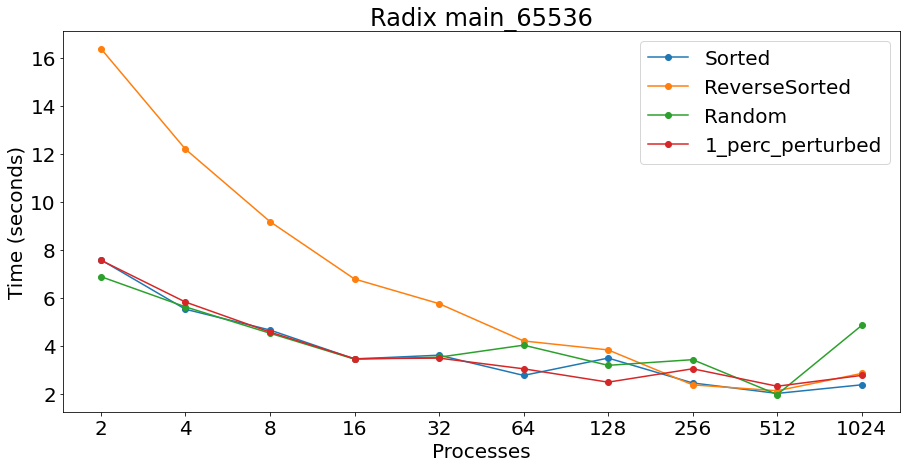

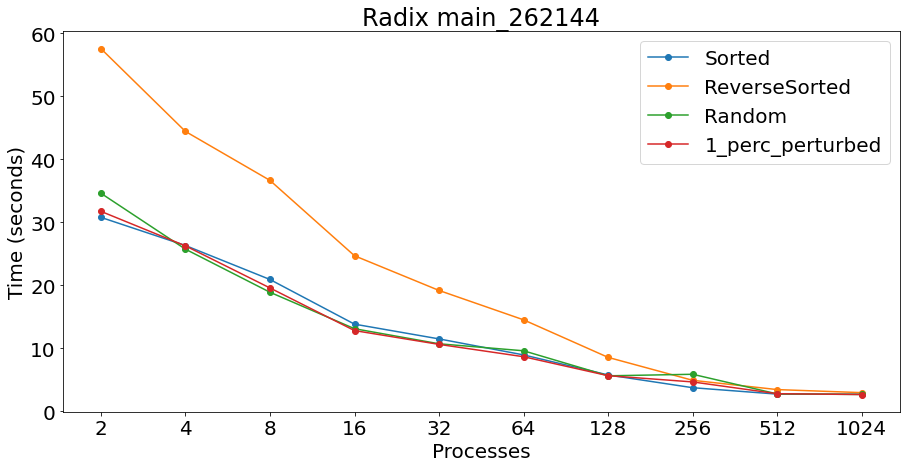

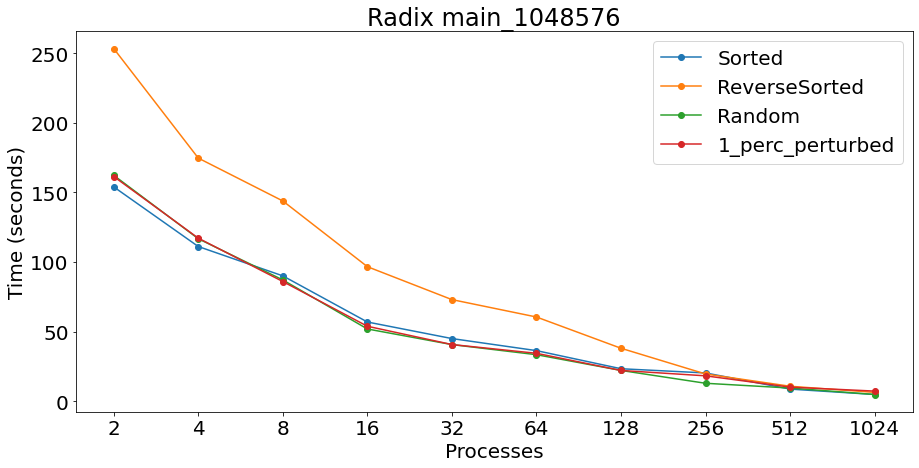

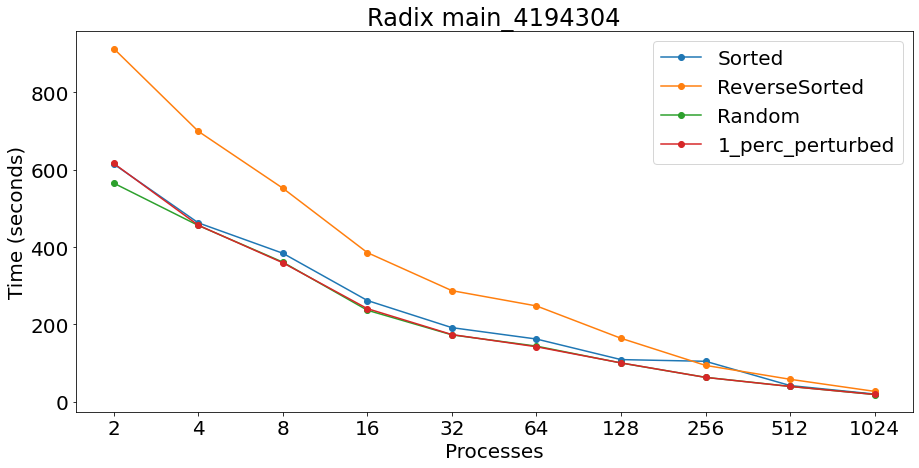

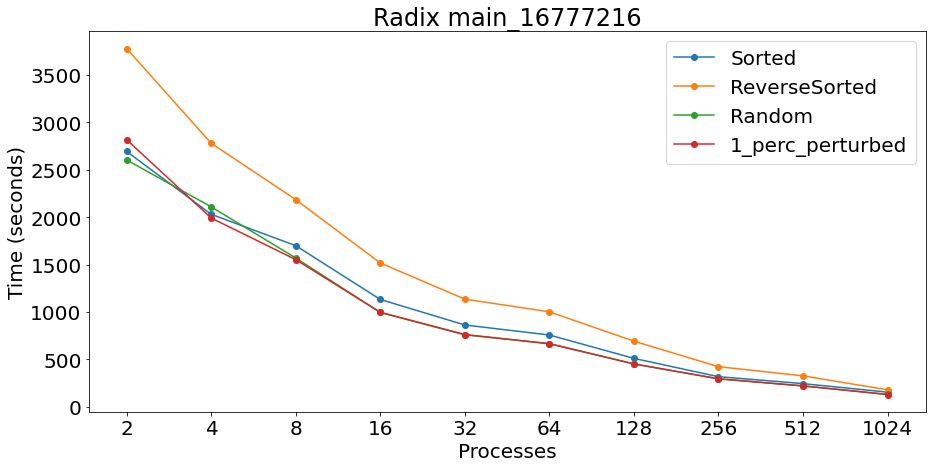

...

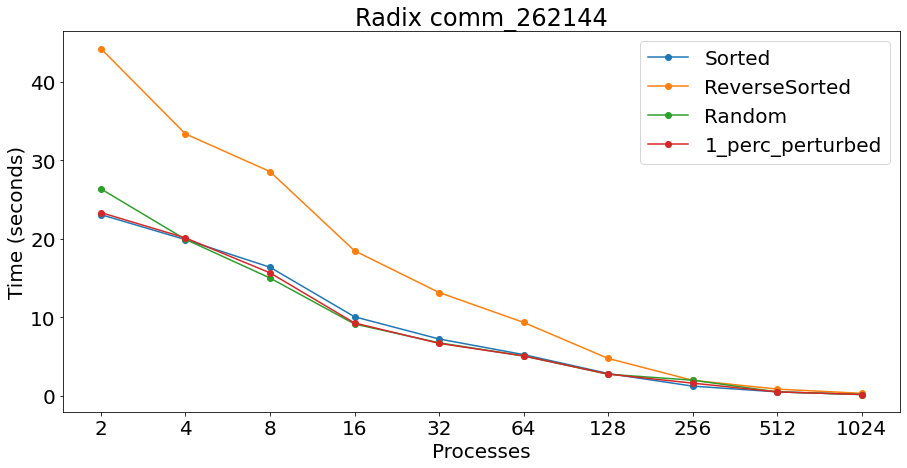

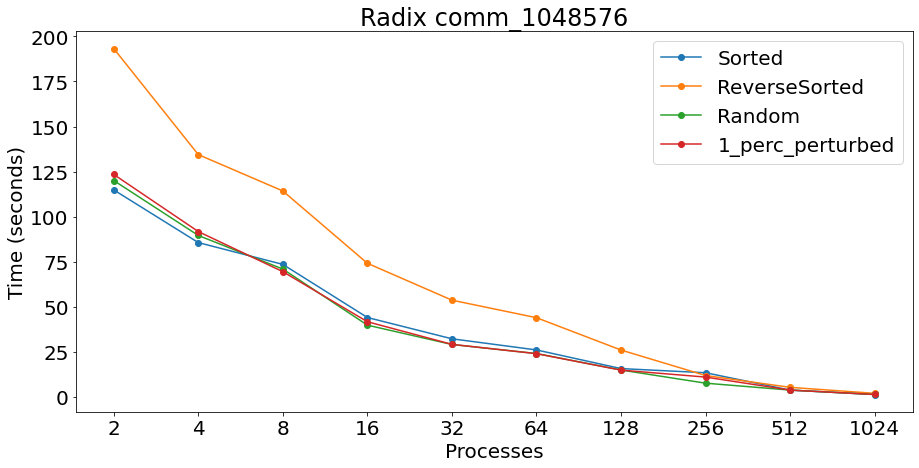

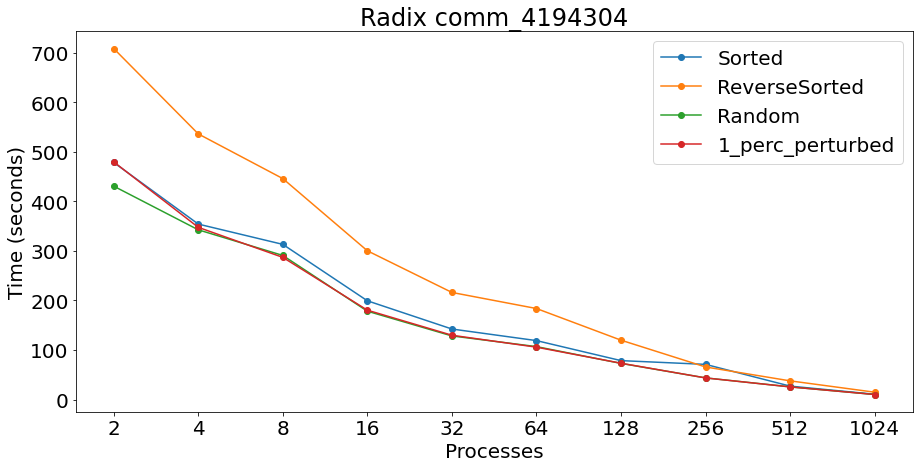

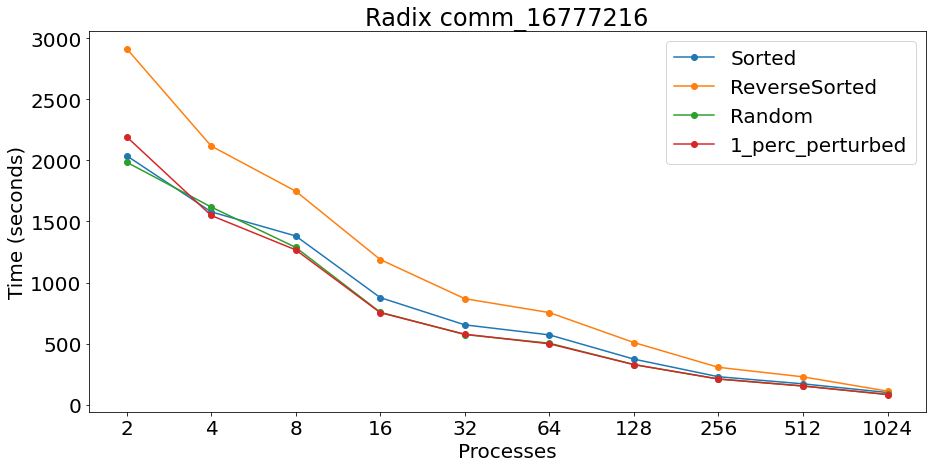

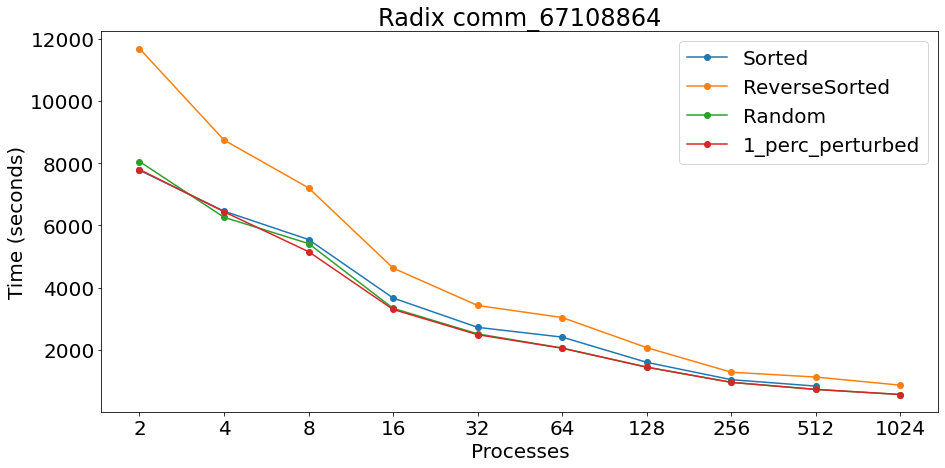

In [62]:
#iterate through nodes, and if comp_large, comm, or main, print the strong scaling
title_template = "Radix {}_{}"
for node in tk.graph.traverse():
    if node.frame['name'] == 'main' or node.frame['name'] == 'comp_large' or node.frame['name'] == 'comm':
        # for input size n, plot 4 plots for each input_type
        for arySize in input_size:
            # title will be node.frame['name']_input_size
            title = title_template.format(node.frame['name'], arySize)
            df = tk.dataframe.loc[node, 'Avg time/rank'] # get average time
            df = (df.loc[df.index.get_level_values('input_size') == arySize])
            df = df.unstack(level="input_type")
            df = df.unstack(level="input_size")
            plot_mpl(df, title, "Processes", "Time (seconds)", input_type)
    

### Strong Scaling Speedup for each input type
- For this, we will do fixed size speedup for the $S_p =\frac{T_2}{T_p}$ for each input_type given problem size $2^{26}$. 

main


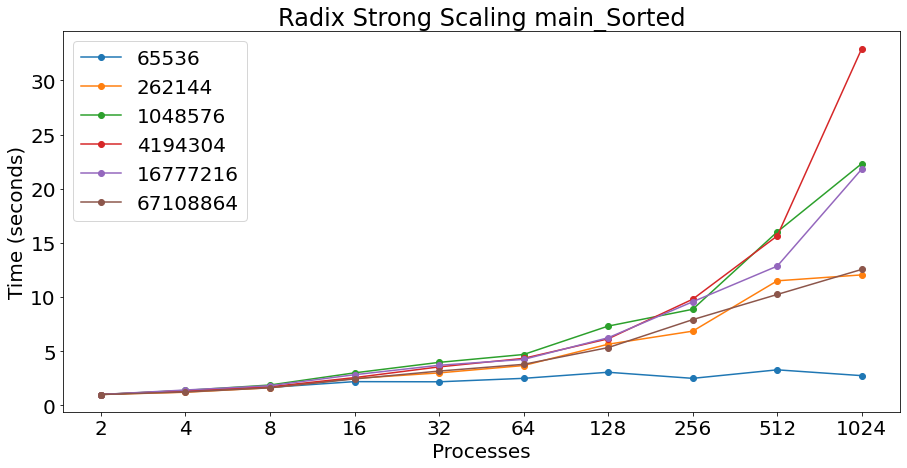

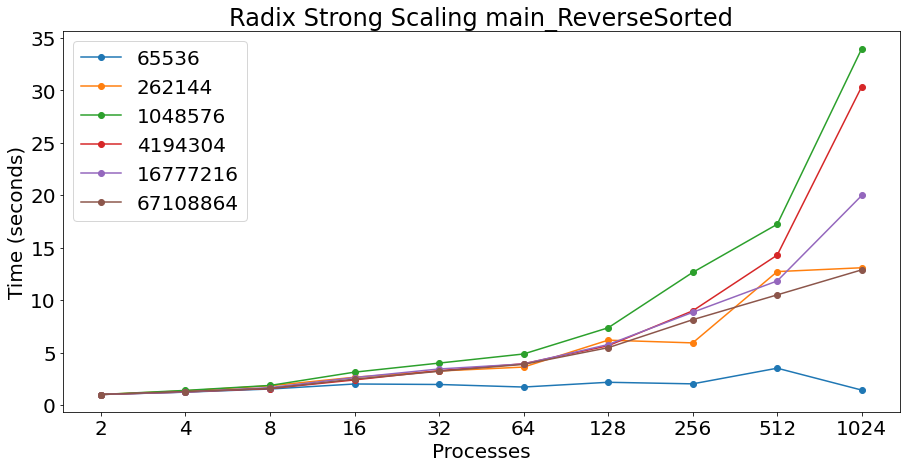

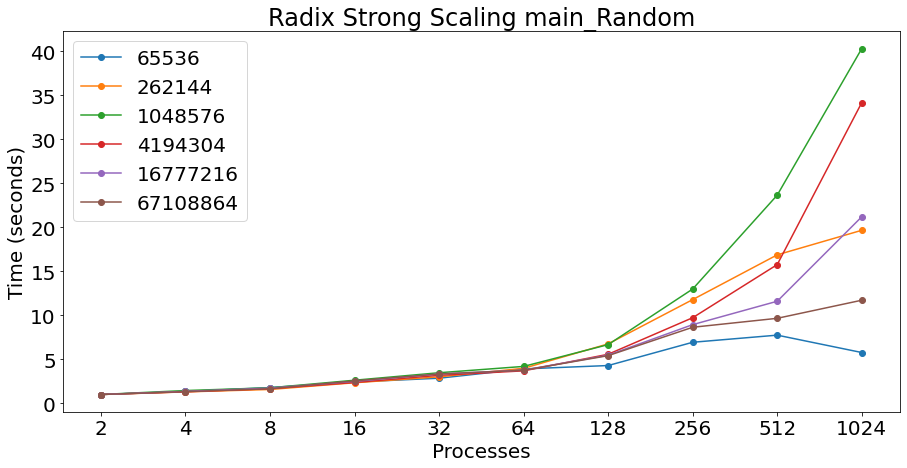

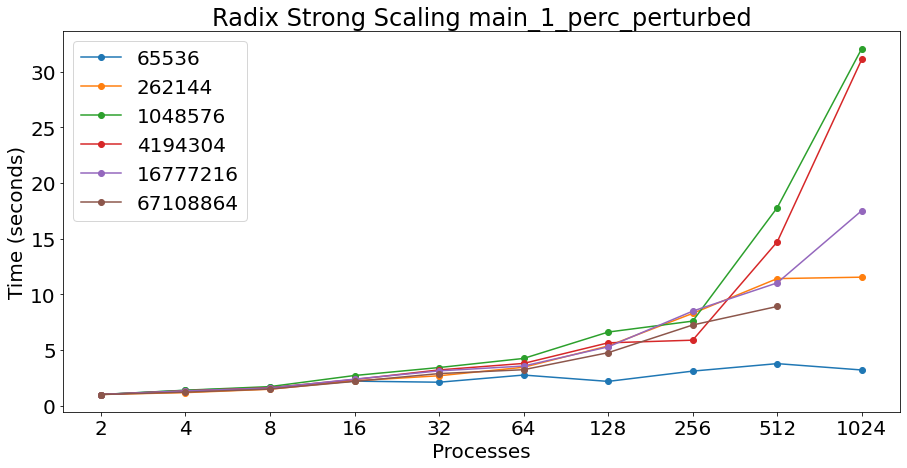

comm


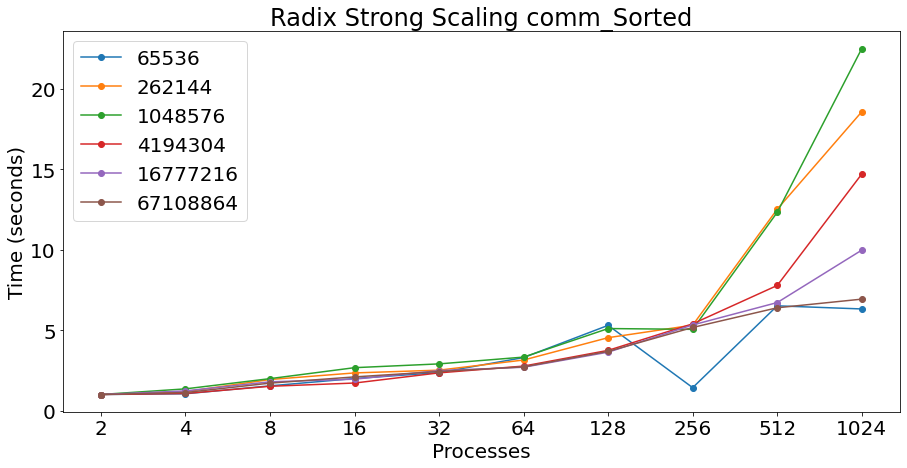

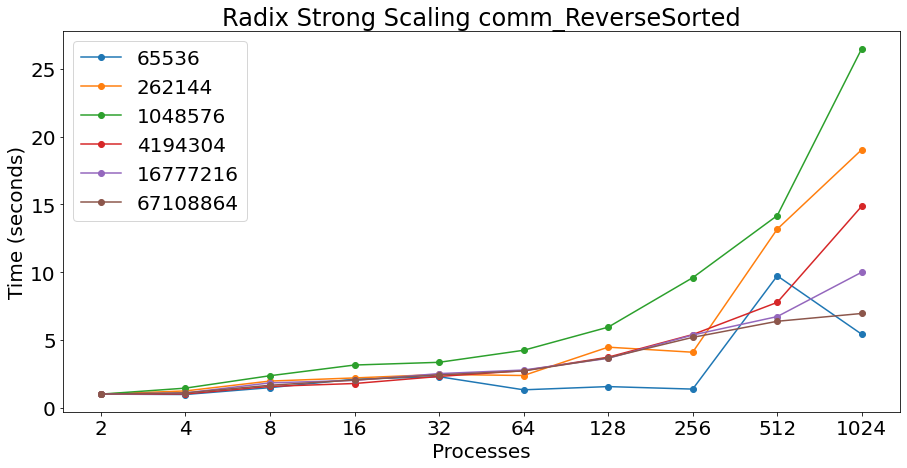

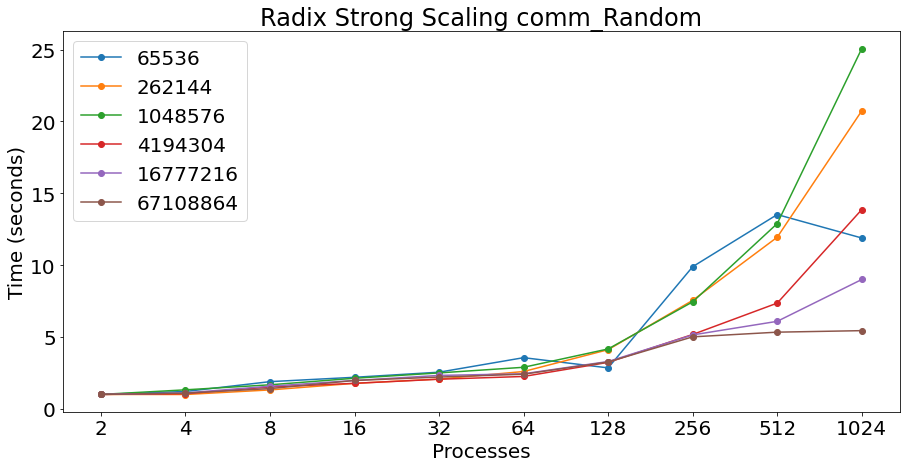

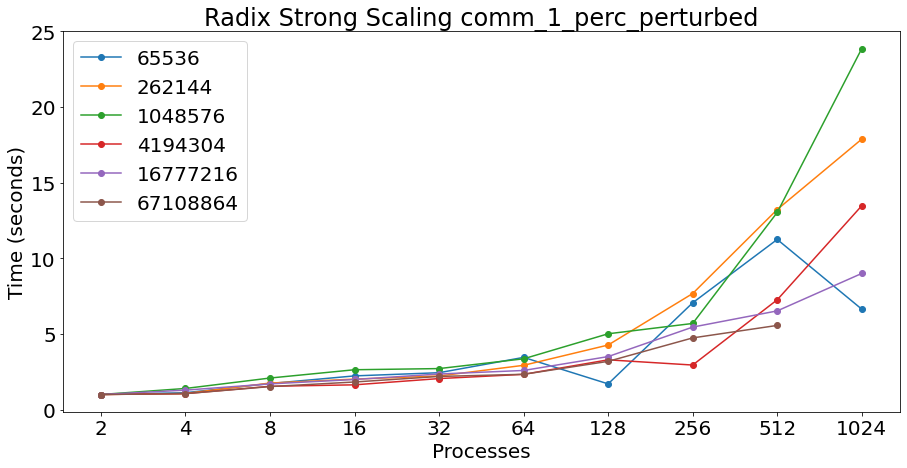

comp_large


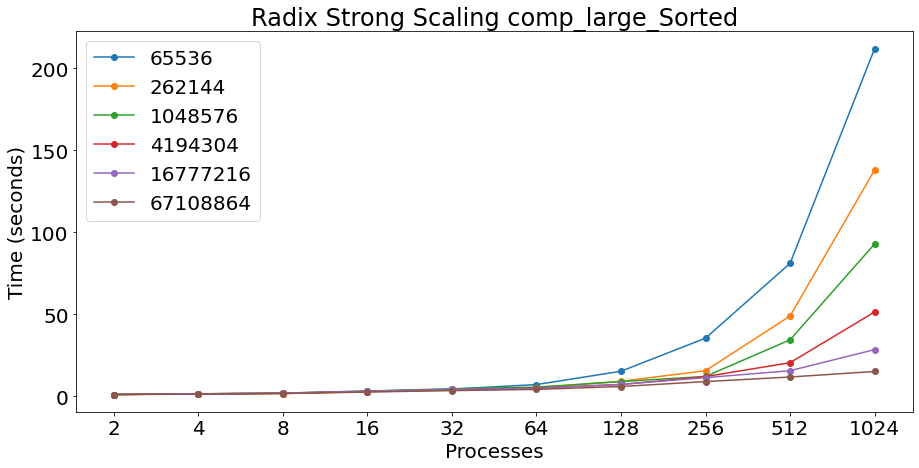

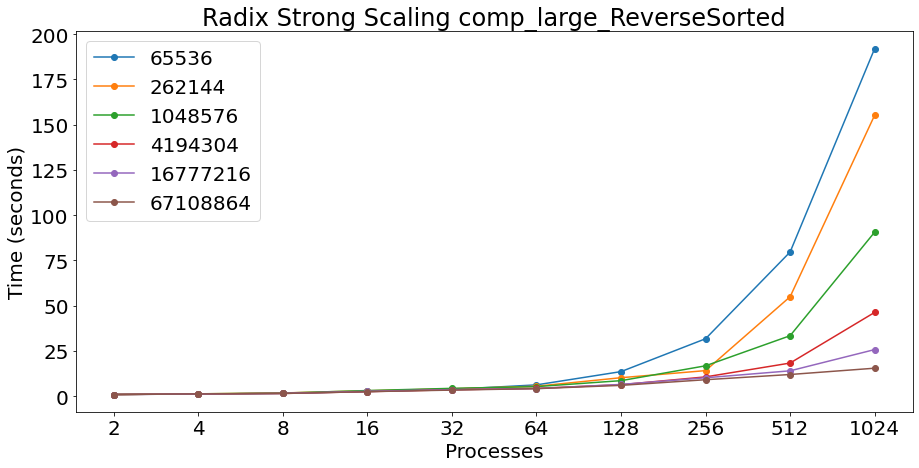

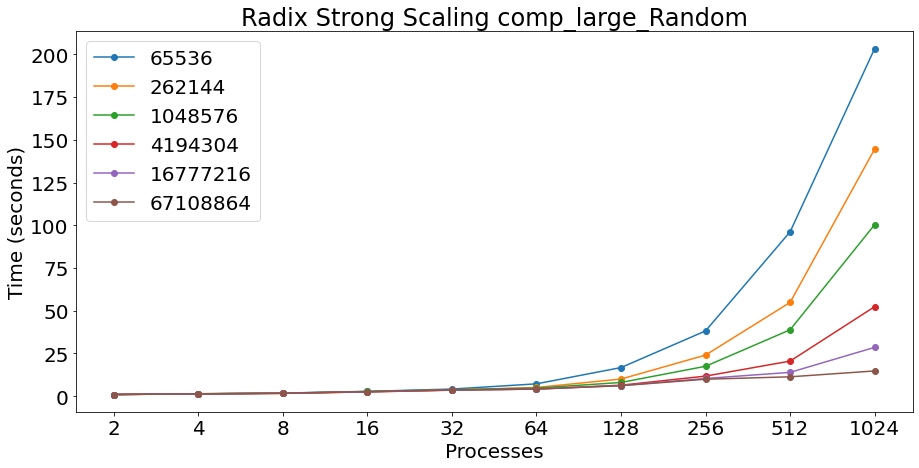

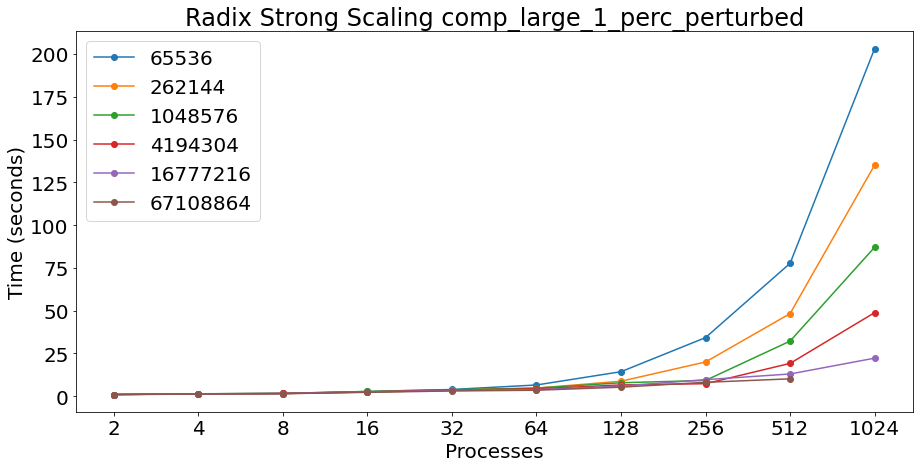

comm


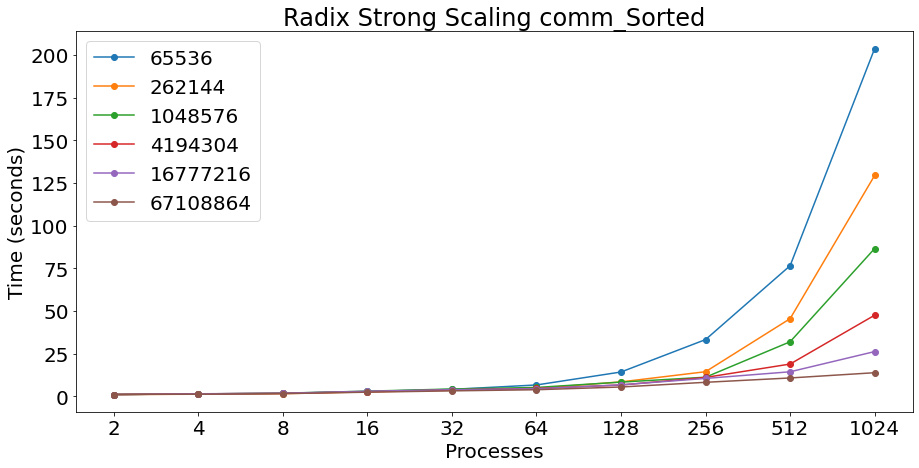

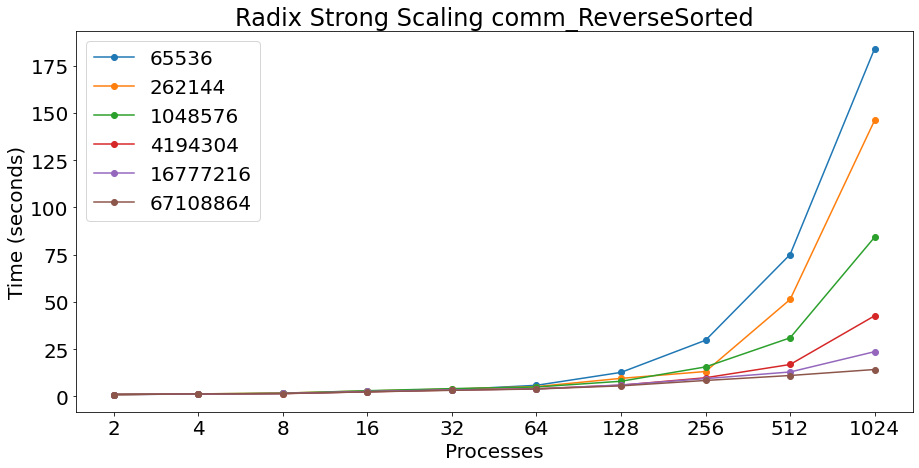

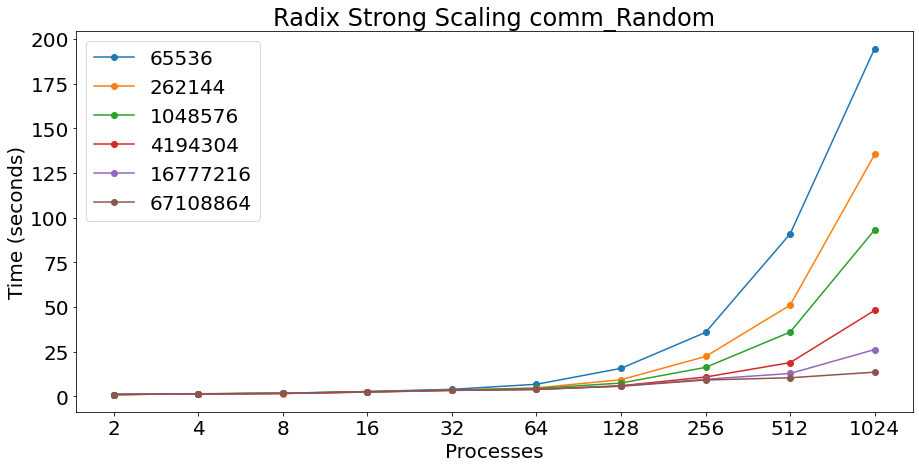

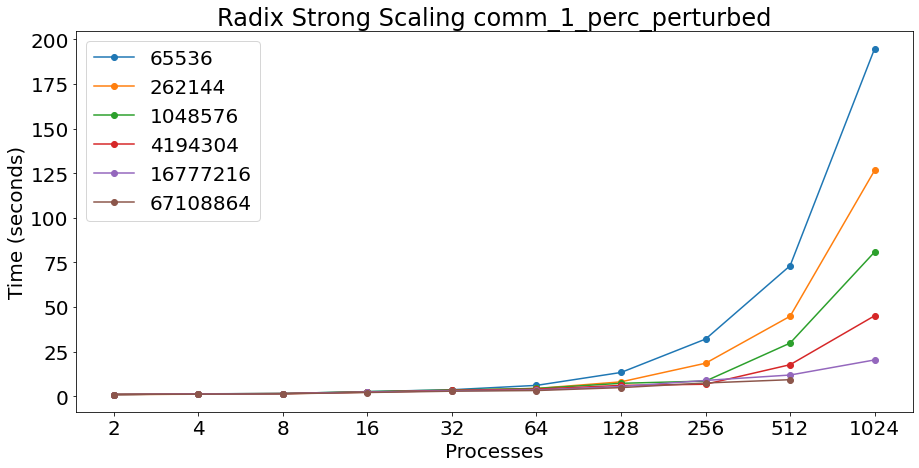

In [63]:
#iterate through nodes, and if comp_large, comm, or main, print the strong scaling
title_template0 = "Radix Strong Scaling {}_{}"

for node in tk.graph.traverse():
    if node.frame['name'] == 'main' or node.frame['name'] == 'comp_large' or node.frame['name'] == 'comm':
        # for input size n, plot 4 plots for each input_type
        print(node.frame['name'])
        for itype in input_type:
            # title will be node.frame['name']_input_size
            title = title_template0.format(node.frame['name'], itype)
            df = tk.dataframe.loc[node, 'Avg time/rank'] # get average time
            df = (df.loc[df.index.get_level_values('input_type') == itype])
            df = df.unstack(level="input_size")
            df = df.unstack(level="input_type")
            twoProcTimes = (df.loc[df.index.get_level_values('num_procs') == 2].values)[0]
            
            for i in range(0,len(twoProcTimes)):
                twoProc = twoProcTimes[i]
                df[input_size[i]] = (df[input_size[i]] / twoProc)**-1
            plot_mpl(df, title, "Processes", "Time (seconds)", input_size)

### Weak Scaling plots for each input type
- Increasing the problem size and processors
- I'm going to do 4 - 2^18, 16 - 2^20, 64 - 2^22, 256 - 2^24, 1024 - 2^26

In [64]:
#iterate through nodes, and if comp_large, comm, or main, print the strong scaling
title_template0 = "Radix Weak Scaling {}_{} For 2^26"

for node  in tk.graph.traverse():
    if node.frame['name'] == 'main' or node.frame['name'] == 'comp_large' or node.frame['name'] == 'comm':
        # for input size n, plot 4 plots for each input_type
        print(node.frame['name'])
        for itype in input_type:
            # title will be node.frame['name']_input_size
            title = title_template0.format(node.frame['name'], itype)
            df = tk.dataframe.loc[node, 'Avg time/rank'] # get average time
            df = (df.loc[df.index.get_level_values('input_type') == itype])
            df = df.unstack(level="input_size")
            df = df.unstack(level="input_type")
            
            print(df)
            
    

main
input_size  65536      262144      1048576     4194304      16777216  \
input_type    Sorted     Sorted      Sorted      Sorted       Sorted   
num_procs                                                              
2           7.556442  31.712369  161.414987  616.462963  2817.308199   
4           5.814348  26.231376  117.133759  456.572918  1990.983705   
8           4.561933  19.548660   85.963014  359.401643  1552.353679   
16          3.452403  12.782332   53.827815  240.768270   996.189153   
32          3.476611  10.589076   40.685266  173.652667   761.800891   
64          3.031115   8.629416   34.387036  142.138638   664.196852   
128         2.474303   5.618549   22.061035  100.407159   451.448189   
256         3.032334   4.628763   18.198457   62.897432   294.594575   
512         2.304887   2.757854   10.077959   39.404471   219.152499   
1024        2.756330   2.632507    7.229903   18.711258   129.088898   

input_size      67108864  
input_type        Sorted  
num_